# Object detection using YOLOv5 model on our own dataset

In this part, we assemble a dataset and train a YOLOv5 model to recognize the books in our dataset. To do so we will take the following steps:

* Gather and create our own dataset of images and label them
* Export our dataset to YOLOv5
* Train YOLOv5 to recognize the objects in our dataset
* Evaluate the performance
* Run test images to view the results



# 1. Install Requirements

In [ ]:
#%cd ..
#%ls .
#!rm -rf yolov5

In [ ]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 14166, done.
remote: Counting objects: 100% (106/106), done.
remote: Compressing objects: 100% (56/56), done.
remote: Total 14166 (delta 64), reused 83 (delta 50), pack-reused 14060
Receiving objects: 100% (14166/14166), 13.60 MiB | 17.51 MiB/s, done.
Resolving deltas: 100% (9727/9727), done.
/content/yolov5
Setup complete. Using torch 1.12.1+cu113 (Tesla T4)


# 2. Assemble Our Dataset

In order to train our custom model, we assembled a dataset of images with bounding box annotations around the books that we want to detect. We created our dataset on https://universe.roboflow.com/cv-yovjv/books-umdmd/dataset/4


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="m3QsJkwxdRWpUgNEnXQL")
project = rf.workspace("cv-yovjv").project("books-umdmd")
dataset = project.version(4).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/books-4 in yolov5pytorch:: 100%|██████████| 666/666 [00:00<00:00, 3602.65it/s]


# 3. Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [ ]:
!python train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/books-4/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-8-g350e8eb Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, 

# Evaluate Custom YOLOv5 Detector Performance

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Test Images With Trained Weights
Run test dataset with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/books-4/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-8-g350e8eb Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
image 1/66 /content/datasets/books-4/test/images/IMG_20221119_203558_jpg.rf.bb8e2945a8b2a2b7b6ff0faf5e4dd352.jpg: 320x416 1 king, 10.9ms
image 2/66 /content/datasets/books-4/test/images/IMG_20221119_203651_jpg.rf.9478ee31362dc32bb75d8ca6f95a02db.jpg: 320x416 1 kassil, 11.8ms
image 3/66 /content/datasets/books-4/test/images/IMG_20

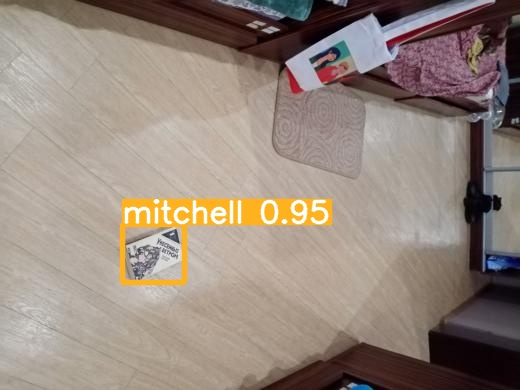

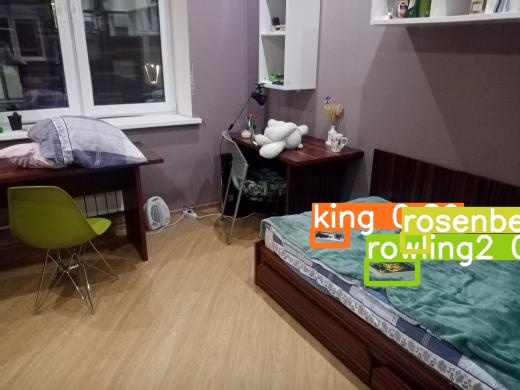

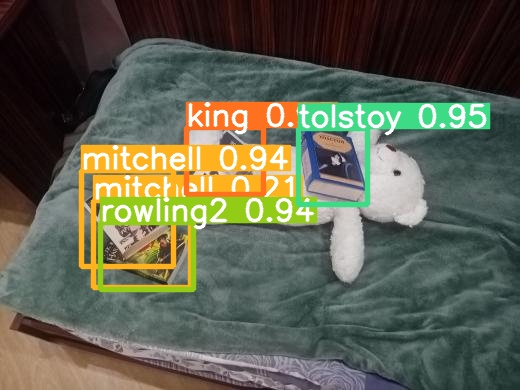

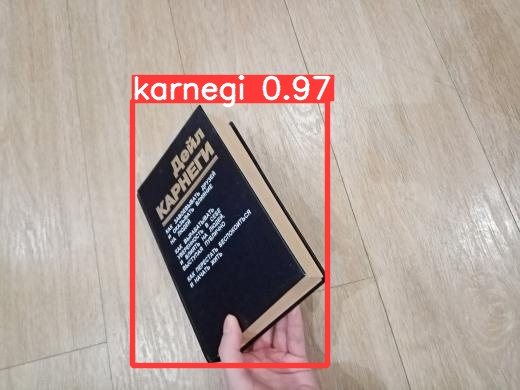

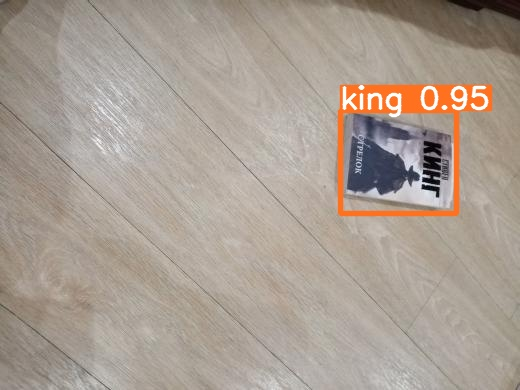

...

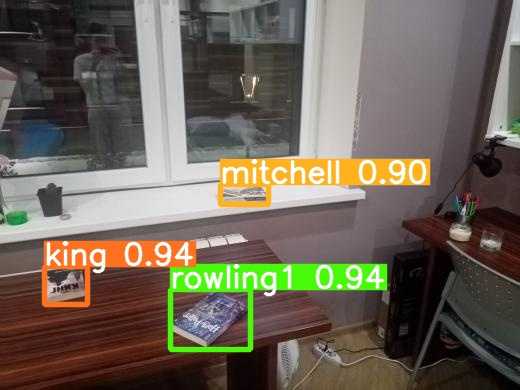

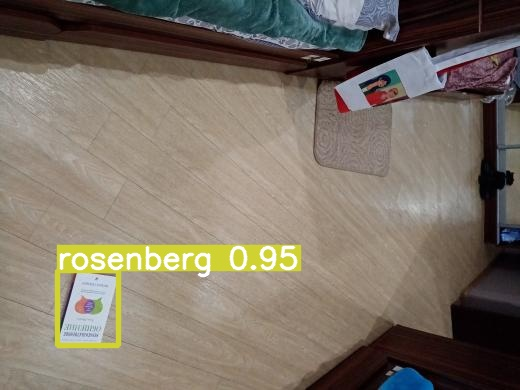

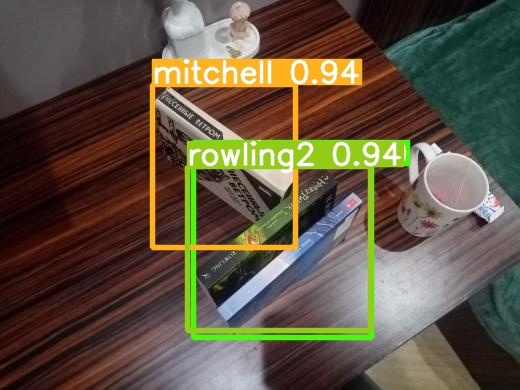

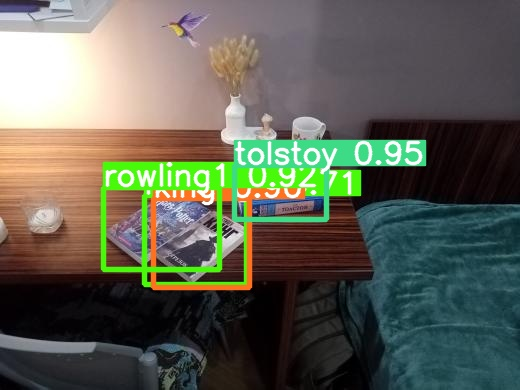

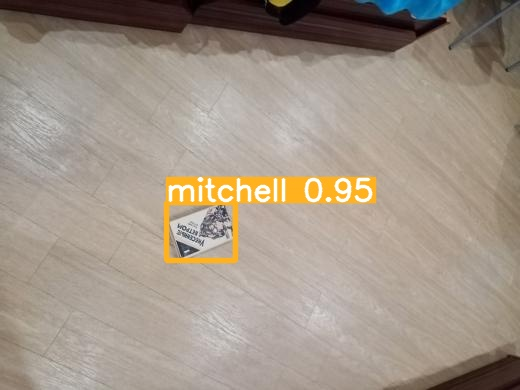

In [ ]:
#display ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

In [ ]:
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [42]:
#!python detect.py --weights yolov5x --data 
!python detect.py --weights runs/train/exp/weights/best.pt --conf 0.3 --source  {dataset.location}/show/1

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/books-4/show/1, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-8-g350e8eb Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
image 1/125 /content/datasets/books-4/show/1/output_001.png: 480x640 1 king, 1 tolstoy, 12.3ms
image 2/125 /content/datasets/books-4/show/1/output_002.png: 480x640 1 karnegi, 3 kings, 1 tolstoy, 13.4ms
image 3/125 /content/datasets/books-4/show/1/output_003.png: 480x640 1 karnegi, 2 kings, 2 tolstoys, 10.2ms
image 4/125 /content/datas

In [43]:
!python detect.py --weights runs/train/exp/weights/best.pt --conf 0.3 --source  {dataset.location}/show/video.mp4

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/books-4/show/video.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-8-g350e8eb Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/592) /content/datasets/books-4/show/video.mp4: 480x640 1 king, 1 mitchell, 1 rosenberg, 1 tolstoy, 12.5ms
video 1/1 (2/592) /content/datasets/books-4/show/video.mp4: 480x640 2 kings, 1 mitchell, 1 rosenberg, 1 tolstoy, 10.2ms
video 1/1 (3/592) /content/datasets/books-4/show/video.mp4: 480x640 2 kings, 1 mitchell, 